In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_columns',None)
csv_collumns = [
    'id','diagnosis','radius_mean',
    'texture_mean','perimeter_mean','area_mean',
    'smoothness_mean','compactness_mean','concavity_mean',
    'concave_points_mean','symmetry_mean','fractal_dimension_mean',
    'radius_se','texture_se','perimeter_se',
    'area_se','smoothness_se','compactness_se',
    'concavity_se','concave_points_se', 'symmetry_se',
    'fractal_dimension_se','radius_worst','texture_worst',
    'perimeter_worst','area_worst','smoothness_worst',
    'compactness_worst','concavity_worst','concave_points_worst',
    'symmetry_worst','fractal_dimension_worst'
]

In [3]:
data_dirty = pd.read_csv('data.csv', names=csv_collumns, skiprows=1)
data_dirty.drop('id',axis=1, inplace=True)

In [4]:
data_dirty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave_points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non-null float64
concave_points_se          569 n

In [5]:
data_dirty.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave_points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave_points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave_points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [6]:
data_dirty.isna().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave_points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave_points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave_points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [7]:
data_dirty.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave_points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [8]:
data_dirty.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave_points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


# Визуализация грязных данных

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fea80ff1860>,
      dtype=object)

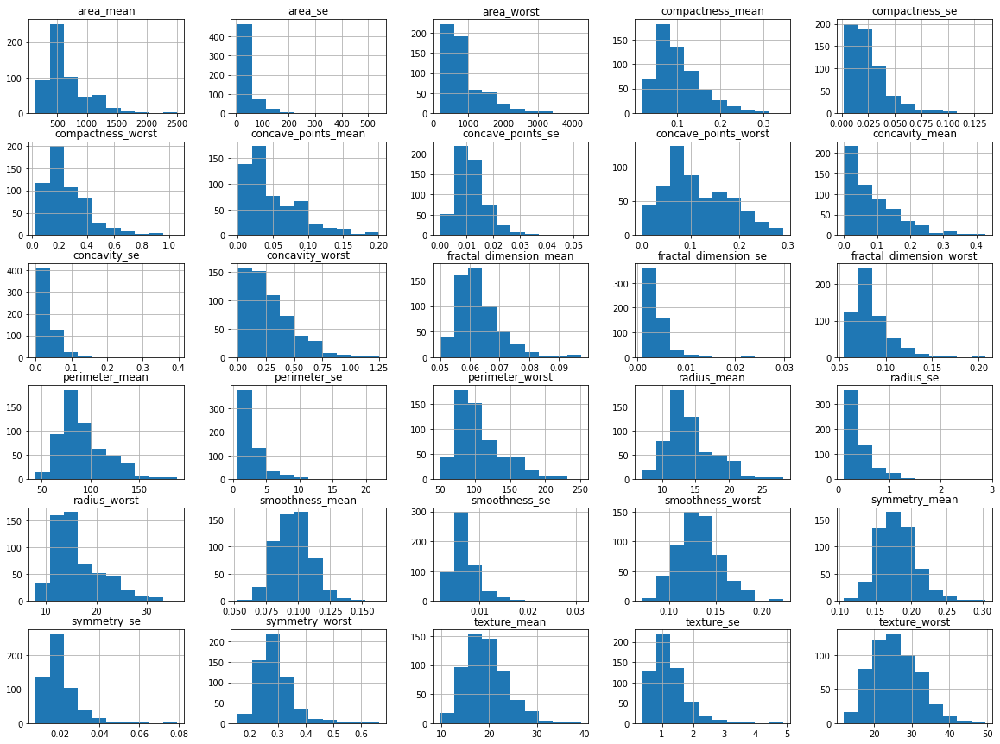

In [9]:
data_dirty.hist(figsize=(20,15))

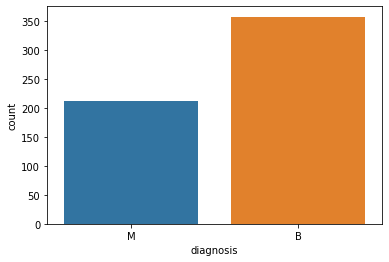

In [10]:
sns.countplot(x='diagnosis', data=data_dirty)

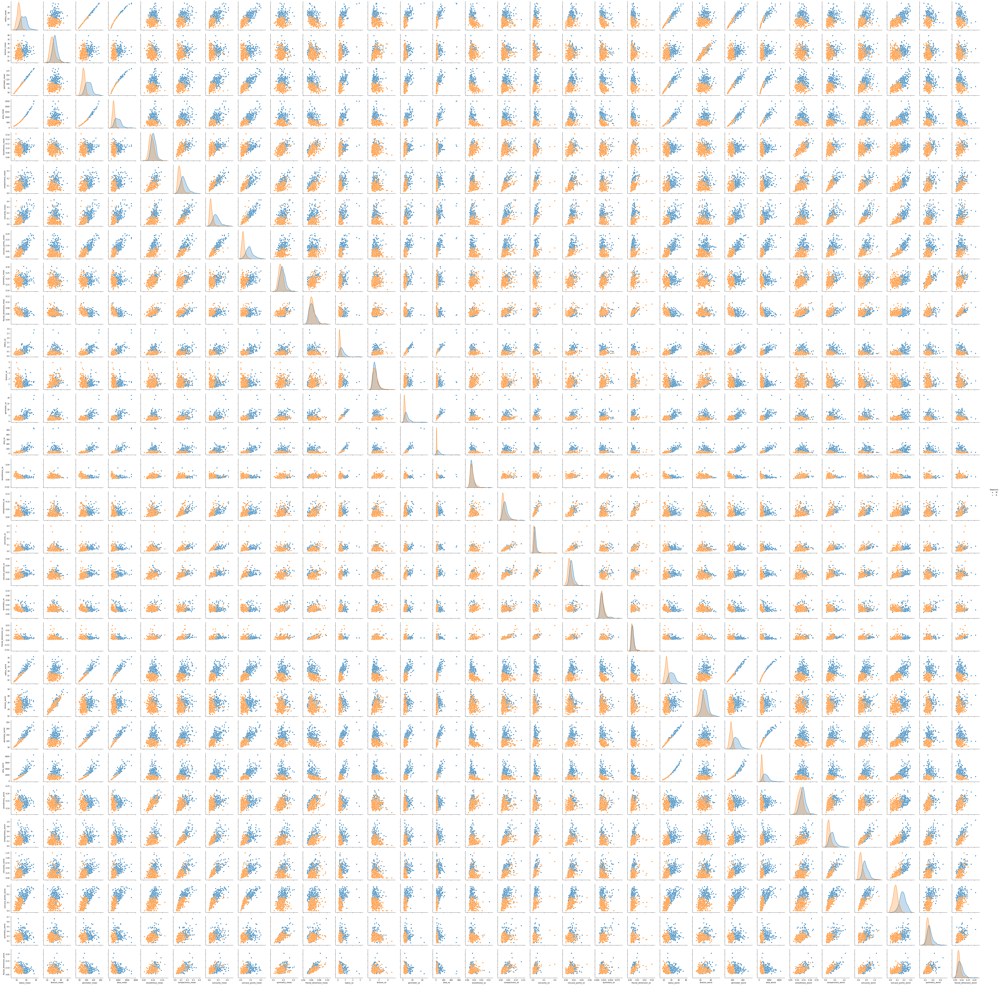

In [11]:
sns.pairplot(data_dirty, hue='diagnosis')

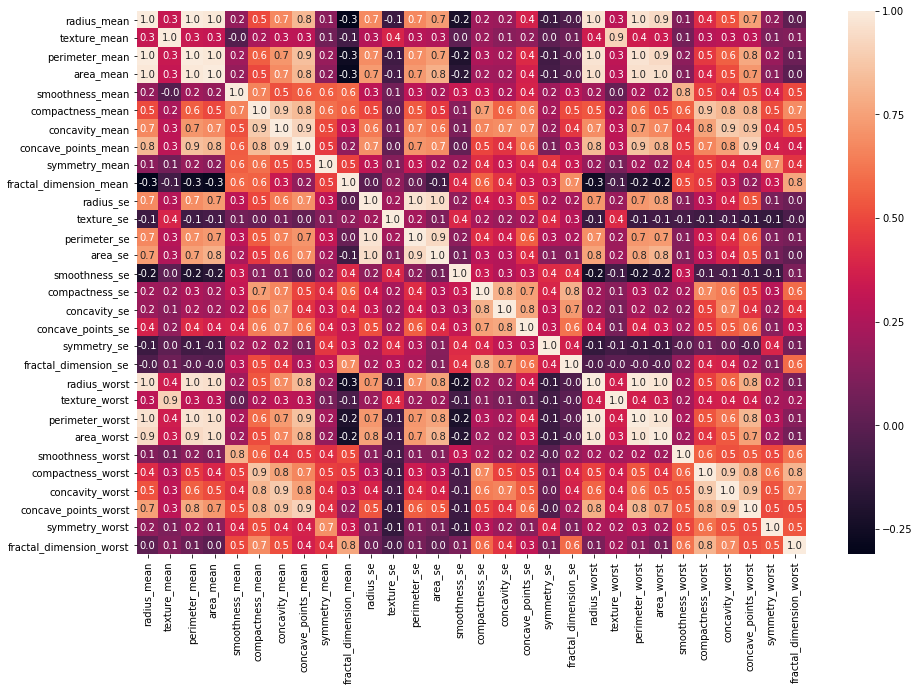

In [12]:
plt.figure(figsize=(15,10))
sns.heatmap(data_dirty.corr(), annot=True, fmt='.1f')

# Очистка данных и визуализация

In [20]:
data_clean = data_dirty.copy(deep=True)

In [21]:
# удалим признаки с сильной кориляцией
corr_matrix = data_clean.drop('diagnosis', axis=1).corr()
corr_matrix = corr_matrix * np.where(np.eye(corr_matrix.shape[0]), 0, 1)
mask = corr_matrix > 0.85
collumns_for_delete = set()

for index, row in mask.iterrows():
    if not collumns_for_delete.issuperset(set(index)):
        for name in row[row == True].index.values:
            collumns_for_delete.add(index)
data_clean.drop(columns=collumns_for_delete, inplace=True)


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fea5e34f630>,
      dtype=object)

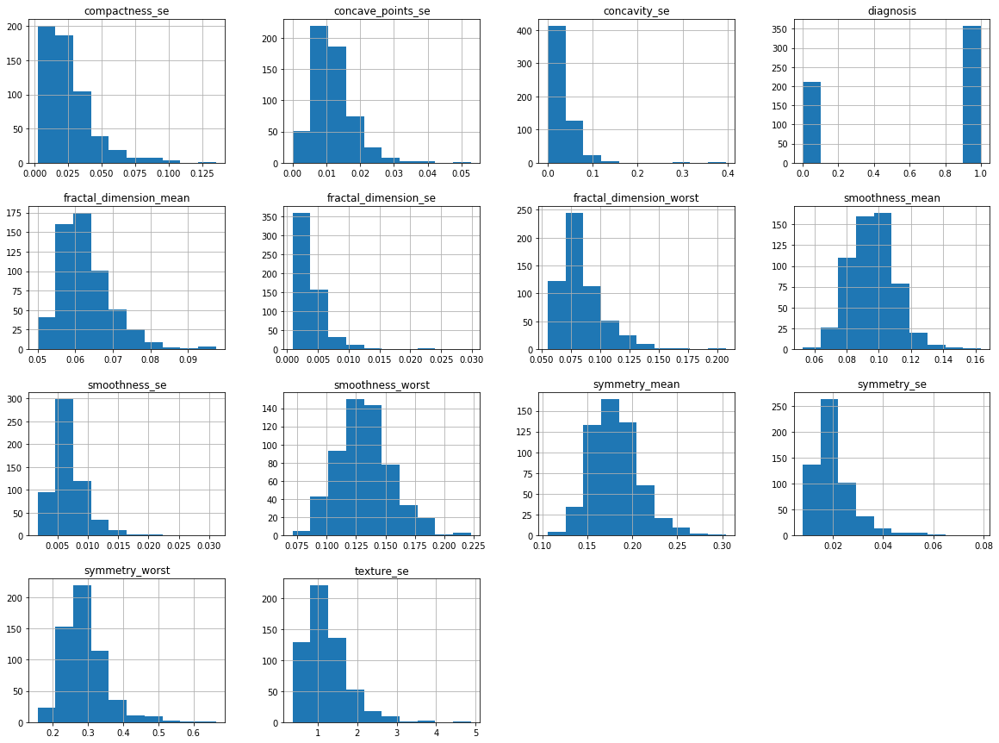

In [18]:
data_clean.hist(figsize=(20,15))

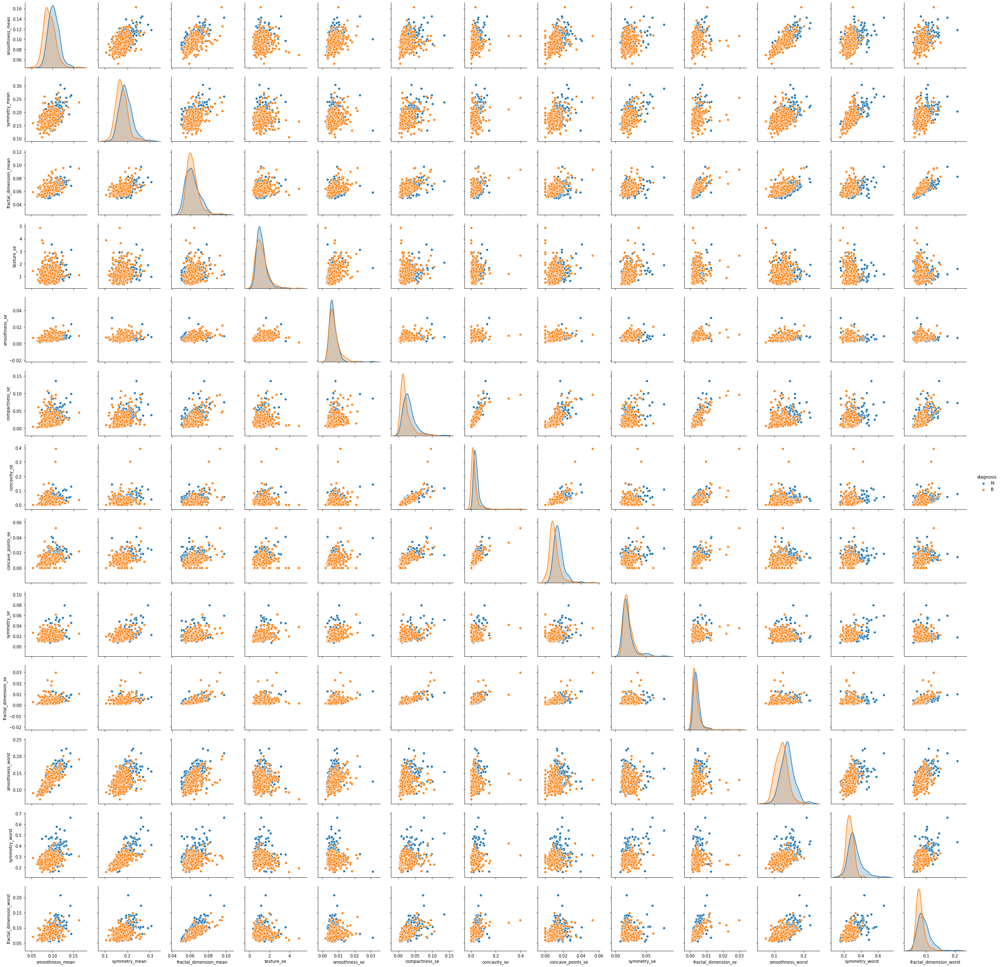

In [23]:
sns.pairplot(data_clean, hue='diagnosis')

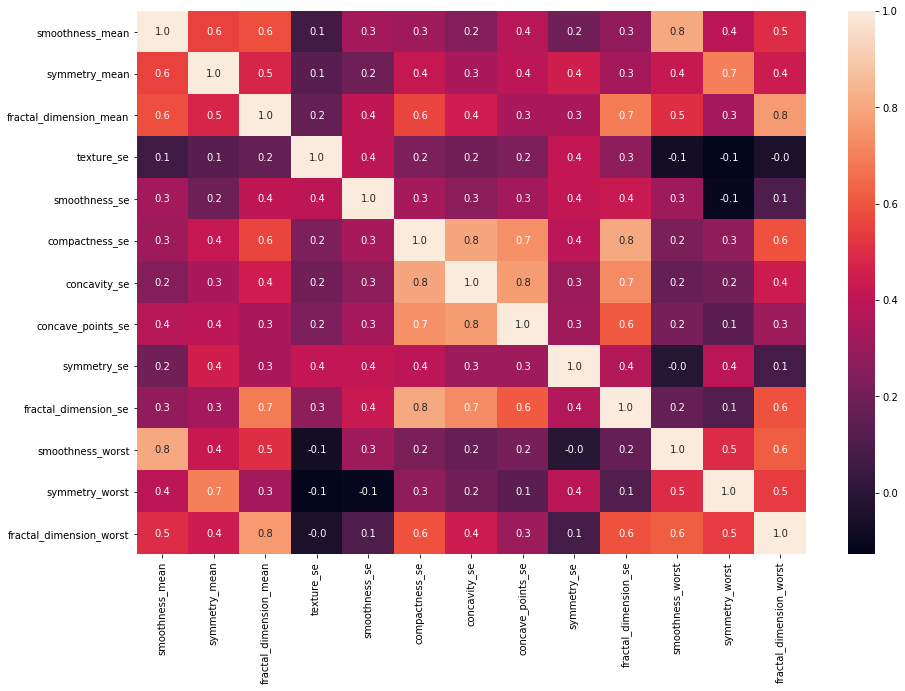

In [24]:
plt.figure(figsize=(15,10))
sns.heatmap(data_clean.corr(), annot=True, fmt='.1f')

# Разбиение на выборки для обучения и тестирования. Маштабирование данных.

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import GridSearchCV


def quality_report(prediction, actual):
    print("Accuracy: {:.3f}\nPrecision: {:.3f}\nRecall: {:.3f}\nf1_score: {:.3f}".format(
        accuracy_score(prediction, actual),
        precision_score(prediction, actual),
        recall_score(prediction, actual),
        f1_score(prediction, actual)
    ))

def get_feature_importance_bar(data, model):
    feature_importance = pd.DataFrame({
        'feature': data.columns,
        'importance': model.coef_[0]
    })
    
    feature_importance.set_index('feature', inplace=True)
    feature_importance.sort_values(['importance'], ascending=False, inplace=True)
    return feature_importance.importance.plot('bar')

In [26]:
data_clean['diagnosis'] = data_clean['diagnosis'].map({'M':0, 'B':1})

X_train, X_test, y_train, y_test = train_test_split (
    data_clean.drop('diagnosis', axis=1),
    data_clean['diagnosis'],
    test_size=0.3,
    stratify=data_clean['diagnosis']
)

In [27]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# LogisticRegression

In [28]:
log_reg = LogisticRegression()
log_reg.fit(X_train_scaled, y_train)
log_reg_predict = log_reg.predict(X_test_scaled)
print("Train quality:")
quality_report(log_reg.predict(X_train_scaled), y_train)
print("\nTest quality:")
quality_report(log_reg.predict(X_test_scaled), y_test)

Train quality:
Accuracy: 0.915
Precision: 0.932
Recall: 0.932
f1_score: 0.932

Test quality:
Accuracy: 0.883
Precision: 0.916
Recall: 0.899
f1_score: 0.907


In [29]:
from sklearn.metrics import roc_auc_score, roc_curve

def plot_roc_curve(prob_prediction, actual):
    fpr, tpr, thresholds = roc_curve(y_test, prob_prediction)
    auc_score = roc_auc_score(y_test, prob_prediction)
    
    plt.plot(fpr, tpr, label='ROC curve ')
    plt.plot([0, 1], [0, 1])
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC AUC: {:.3f}'.format(auc_score))
    return plt
#     plt.show()

<module 'matplotlib.pyplot' from '/home/tay/ml-2019-08/venv/lib/python3.6/site-packages/matplotlib/pyplot.py'>

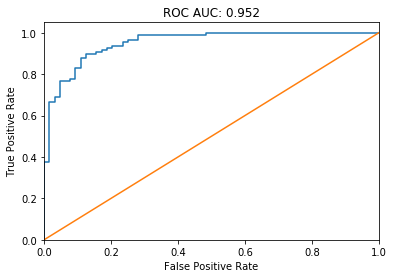

In [30]:
plot_roc_curve(log_reg.predict_proba(X_test_scaled)[:,1], y_test)

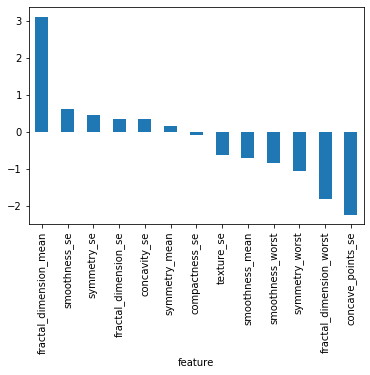

In [31]:
get_feature_importance_bar(data_clean.drop('diagnosis', axis=1), log_reg)

# LogisticRegressionCV

In [32]:
param_grid = {
        'Cs': range(1, 100)
}
log_reg_cv = LogisticRegressionCV()
grid_search = GridSearchCV(log_reg_cv, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train_scaled, y_train)
print("Best CV score: {:.3f}, best CV Cs: {}".format(
    grid_search.best_score_, grid_search.best_estimator_.Cs)
) 


# log_reg_cv = LogisticRegressionCV(Cs=100)
# log_reg_cv.fit(X_train_scaled, y_train)
# print("Train quality:")
# quality_report(log_reg_cv.predict(X_train_scaled), y_train)
# print("\nTest quality:")
# quality_report(log_reg_cv.predict(X_test_scaled), y_test)


Best CV score: 0.948, best CV Cs: 61


In [33]:
log_reg_cv = grid_search.best_estimator_
print("Train quality:")
quality_report(log_reg_cv.predict(X_train_scaled), y_train)
print("\nTest quality:")
quality_report(log_reg_cv.predict(X_test_scaled), y_test)

Train quality:
Accuracy: 0.912
Precision: 0.940
Recall: 0.922
f1_score: 0.931

Test quality:
Accuracy: 0.895
Precision: 0.935
Recall: 0.901
f1_score: 0.917


<module 'matplotlib.pyplot' from '/home/tay/ml-2019-08/venv/lib/python3.6/site-packages/matplotlib/pyplot.py'>

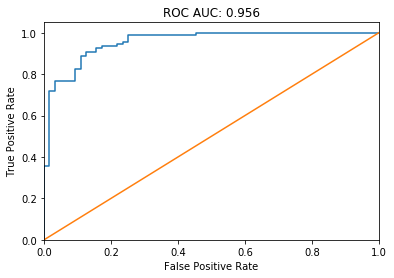

In [34]:
plot_roc_curve(log_reg_cv.predict_proba(X_test_scaled)[:,1], y_test)

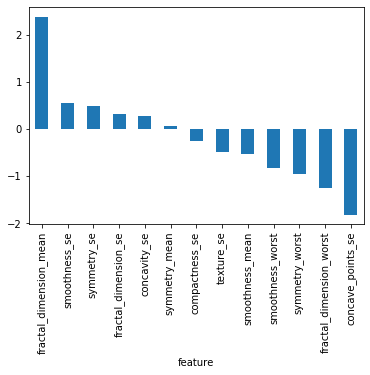

In [35]:
get_feature_importance_bar(data_clean.drop('diagnosis', axis=1),log_reg_cv)

# KNeighborsClassifier

In [38]:
from sklearn.neighbors import KNeighborsClassifier
param_grid = {
        'n_neighbors': range(1, 50)
}
knn = KNeighborsClassifier()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train_scaled, y_train)
print("Best CV score: {:.3f}, best CV k: {}".format(
    grid_search.best_score_, grid_search.best_estimator_.n_neighbors)
)
knn = grid_search.best_estimator_

Best CV score: 0.912, best CV k: 19


/home/tay/ml-2019-08/venv/lib/python3.6/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [39]:
print("Train quality:")
quality_report(knn.predict(X_train_scaled), y_train)
print("\nTest quality:")
quality_report(knn.predict(X_test_scaled), y_test)

Train quality:
Accuracy: 0.872
Precision: 0.920
Recall: 0.881
f1_score: 0.900

Test quality:
Accuracy: 0.883
Precision: 0.907
Recall: 0.907
f1_score: 0.907


<module 'matplotlib.pyplot' from '/home/tay/ml-2019-08/venv/lib/python3.6/site-packages/matplotlib/pyplot.py'>

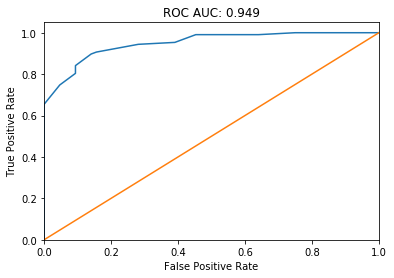

In [40]:
plot_roc_curve(knn.predict_proba(X_test_scaled)[:,1], y_test)

# Сравнение моделей

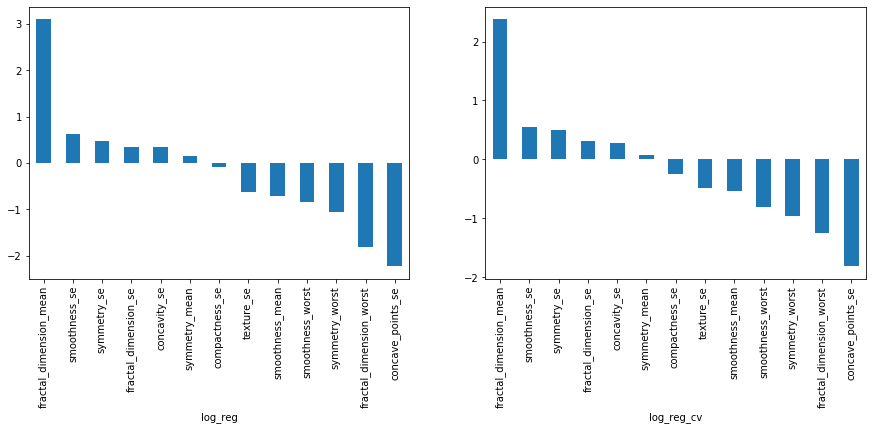

In [41]:
data_bar = data_clean.drop('diagnosis', axis=1)
# важность признаков
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
get_feature_importance_bar(data_bar, log_reg)
plt.xlabel('log_reg')

plt.subplot(1,2,2)
get_feature_importance_bar(data_bar, log_reg_cv)
plt.xlabel('log_reg_cv')
plt.show()

Text(0.5, 0, 'knn')

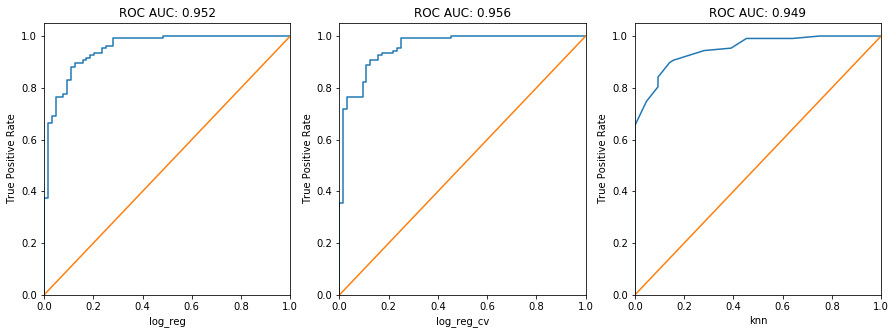

In [42]:
# качество класификаторов
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plot_roc_curve(log_reg.predict_proba(X_test_scaled)[:,1], y_test).xlabel('log_reg')


plt.subplot(1,3,2)
plot_roc_curve(log_reg_cv.predict_proba(X_test_scaled)[:,1], y_test).xlabel('log_reg_cv')

plt.subplot(1,3,3)
plot_roc_curve(knn.predict_proba(X_test_scaled)[:,1], y_test).xlabel('knn')


